In [1]:
import os, re, random, glob
from pathlib import Path
from typing import List, Tuple, Dict

# נתיב מוחלט – כך ש־VS Code ידע בדיוק איפה לחפש
ROOT_DIR = Path(r"C:\Users\Reuth\anaconda_projects\image_project\photos_for_tags_algo")

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

def normalize_stem(stem: str) -> str:
    """מסיר סיומות כמו _MASK/_mask/_MARKED משם הקובץ"""
    return re.sub(r'(?i)_(mask|marked)$', '', stem)

def is_marked(stem: str) -> bool:
    return re.search(r'(?i)_marked$', stem) is not None

def is_mask(stem: str) -> bool:
    return re.search(r'(?i)_mask$', stem) is not None

def scan_pairs(root: Path) -> List[Tuple[Path, Path]]:
    """סריקה רקורסיבית של תמונות ומאסקים תואמים"""
    files = [Path(p) for p in glob.glob(str(root / "**" / "*"), recursive=True)]
    files = [p for p in files if p.is_file() and p.suffix.lower() in IMG_EXTS]

    by_base: Dict[str, Dict[str, Path]] = {}
    for p in files:
        stem = p.stem
        base = normalize_stem(stem)
        if is_marked(stem):
            continue
        entry = by_base.setdefault(base, {})
        if is_mask(stem):
            entry["mask"] = p
        else:
            entry["img"] = p

    pairs = [(rec["img"], rec["mask"]) for rec in by_base.values() if "img" in rec and "mask" in rec]
    return pairs

pairs = scan_pairs(ROOT_DIR)
print(f"Found {len(pairs)} image-mask pairs")
for i in range(min(5, len(pairs))):
    print(pairs[i])


Found 143 image-mask pairs
(WindowsPath('C:/Users/Reuth/anaconda_projects/image_project/photos_for_tags_algo/10/IMG_0026.JPG'), WindowsPath('C:/Users/Reuth/anaconda_projects/image_project/photos_for_tags_algo/10/IMG_0026_MASK.jpg'))
(WindowsPath('C:/Users/Reuth/anaconda_projects/image_project/photos_for_tags_algo/10/IMG_0462.JPG'), WindowsPath('C:/Users/Reuth/anaconda_projects/image_project/photos_for_tags_algo/10/IMG_0462_MASK.jpg'))
(WindowsPath('C:/Users/Reuth/anaconda_projects/image_project/photos_for_tags_algo/10/IMG_0792.JPG'), WindowsPath('C:/Users/Reuth/anaconda_projects/image_project/photos_for_tags_algo/10/IMG_0792_MASK.jpg'))
(WindowsPath('C:/Users/Reuth/anaconda_projects/image_project/photos_for_tags_algo/10/IMG_0811.JPG'), WindowsPath('C:/Users/Reuth/anaconda_projects/image_project/photos_for_tags_algo/10/IMG_0811_MASK.jpg'))
(WindowsPath('C:/Users/Reuth/anaconda_projects/image_project/photos_for_tags_algo/10/IMG_0813.JPG'), WindowsPath('C:/Users/Reuth/anaconda_projects/im

In [2]:
import os, random
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch_directml
from torch.amp import autocast, GradScaler


In [3]:
IMG_SIZE = 256
BATCH = 4
VAL_SPLIT = 0.2
RANDOM_SEED = 42

device = torch_directml.device()
print(f"✅ Using DirectML device: {device}")


✅ Using DirectML device: privateuseone:0


In [4]:
def get_transforms(train=True):
    if train:
        return transforms.Compose([
            transforms.Resize((IMG_SIZE, IMG_SIZE)),
            transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.05),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomVerticalFlip(p=0.3),
            transforms.RandomRotation(15),
            transforms.RandomResizedCrop(IMG_SIZE, scale=(0.8, 1.0)),
            transforms.ToTensor()
        ])
    else:
        return transforms.Compose([
            transforms.Resize((IMG_SIZE, IMG_SIZE)),
            transforms.ToTensor()
        ])

class SegDataset(Dataset):
    def __init__(self, pairs, train=True):
        self.pairs = pairs
        self.tf_img = get_transforms(train=train)
        self.tf_mask = transforms.Compose([
            transforms.Resize((IMG_SIZE, IMG_SIZE)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        img_path, mask_path = self.pairs[idx]
        img = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")

        img = self.tf_img(img)
        mask = self.tf_mask(mask)
        mask = (mask > 0.5).float()

        return img, mask, str(img_path)

# פיצול ל־train/val
random.seed(RANDOM_SEED)
random.shuffle(pairs)
n_total = len(pairs)
n_val = max(1, int(n_total * VAL_SPLIT))
n_train = n_total - n_val
train_pairs, val_pairs = pairs[:n_train], pairs[n_train:]

train_ds = SegDataset(train_pairs, train=True)
val_ds   = SegDataset(val_pairs, train=False)

train_loader = DataLoader(train_ds, batch_size=BATCH, shuffle=True, num_workers=0, pin_memory=False)
val_loader   = DataLoader(val_ds,   batch_size=BATCH, shuffle=False, num_workers=0, pin_memory=False)

print(f"Train: {len(train_ds)}  |  Val: {len(val_ds)}")


Train: 115  |  Val: 28


In [5]:
def conv_block(in_ch, out_ch, drop=0.1):
    return nn.Sequential(
        nn.Conv2d(in_ch, out_ch, 3, padding=1),
        nn.BatchNorm2d(out_ch),
        nn.ReLU(inplace=True),
        nn.Dropout2d(p=drop),
        nn.Conv2d(out_ch, out_ch, 3, padding=1),
        nn.BatchNorm2d(out_ch),
        nn.ReLU(inplace=True),
        nn.Dropout2d(p=drop)
    )

class UNet(nn.Module):
    def __init__(self, in_ch=3, out_ch=1, base_ch=32):
        super().__init__()
        self.enc1 = conv_block(in_ch, base_ch)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = conv_block(base_ch, base_ch*2)
        self.pool2 = nn.MaxPool2d(2)
        self.enc3 = conv_block(base_ch*2, base_ch*4)
        self.pool3 = nn.MaxPool2d(2)
        self.enc4 = conv_block(base_ch*4, base_ch*8)
        self.pool4 = nn.MaxPool2d(2)

        self.bottleneck = conv_block(base_ch*8, base_ch*16)

        self.up4 = nn.ConvTranspose2d(base_ch*16, base_ch*8, 2, stride=2)
        self.dec4 = conv_block(base_ch*16, base_ch*8)
        self.up3 = nn.ConvTranspose2d(base_ch*8, base_ch*4, 2, stride=2)
        self.dec3 = conv_block(base_ch*8, base_ch*4)
        self.up2 = nn.ConvTranspose2d(base_ch*4, base_ch*2, 2, stride=2)
        self.dec2 = conv_block(base_ch*4, base_ch*2)
        self.up1 = nn.ConvTranspose2d(base_ch*2, base_ch, 2, stride=2)
        self.dec1 = conv_block(base_ch*2, base_ch)
        self.outc = nn.Conv2d(base_ch, out_ch, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        e3 = self.enc3(self.pool2(e2))
        e4 = self.enc4(self.pool3(e3))
        b  = self.bottleneck(self.pool4(e4))
        d4 = self.up4(b); d4 = torch.cat([d4, e4], dim=1); d4 = self.dec4(d4)
        d3 = self.up3(d4); d3 = torch.cat([d3, e3], dim=1); d3 = self.dec3(d3)
        d2 = self.up2(d3); d2 = torch.cat([d2, e2], dim=1); d2 = self.dec2(d2)
        d1 = self.up1(d2); d1 = torch.cat([d1, e1], dim=1); d1 = self.dec1(d1)
        return self.outc(d1)


In [6]:
# ==== LOSSES & METRICS (anti-FP) ====
import torch
import torch.nn.functional as F

# 1) Focal-Tversky (מעניש FP חזק ע"י alpha גבוה)
def focal_tversky_loss(logits, targets, alpha=0.75, beta=0.25, gamma=1.25, eps=1e-6):
    p = torch.sigmoid(logits)
    tp = (p * targets).sum(dim=(2,3))
    fp = ((1 - targets) * p).sum(dim=(2,3))
    fn = (targets * (1 - p)).sum(dim=(2,3))
    tversky = (tp + eps) / (tp + alpha*fp + beta*fn + eps)
    loss = (1.0 - tversky) ** gamma
    return loss.mean()

# 2) BCE עם משקל דיפרנציאלי לפיקסלים שליליים (מעניש FP)
def weighted_bce_logits(logits, targets, w_pos=1.0, w_neg=2.0):
    # w_neg>1 => FP מקבל ענישה גבוהה יותר
    weights = torch.where(targets > 0.5,
                          torch.tensor(w_pos, device=logits.device),
                          torch.tensor(w_neg, device=logits.device))
    return F.binary_cross_entropy_with_logits(logits, targets, weight=weights)

# 3) Boundary loss קטן (מחדד שוליים)
def boundary_loss(logits, targets, eps=1e-6):
    # מסנני סובל לקצוות
    kx = torch.tensor([[1,0,-1],[2,0,-2],[1,0,-1]], dtype=torch.float32, device=logits.device).view(1,1,3,3)
    ky = torch.tensor([[1,2,1],[0,0,0],[-1,-2,-1]], dtype=torch.float32, device=logits.device).view(1,1,3,3)
    p = torch.sigmoid(logits)
    px = F.conv2d(p, kx, padding=1);  py = F.conv2d(p, ky, padding=1)
    tx = F.conv2d(targets, kx, padding=1); ty = F.conv2d(targets, ky, padding=1)
    pedge = torch.sqrt(px*px + py*py + eps)
    tedge = torch.sqrt(tx*tx + ty*ty + eps)
    return F.l1_loss(pedge, tedge)

# 4) Area prior penalty (מונע מסכה ענקית)
# מצמיד את שטח החיזוי לשטח ה-GT (עם מרווח) ומעניש חריגות גדולות (בעיקר FP).
def area_prior_penalty(logits, targets, margin=1.35):
    p = torch.sigmoid(logits)
    p_mean = p.mean(dim=(2,3))
    t_mean = targets.mean(dim=(2,3))
    # מאפשר עד 35% יותר מה-GT, מעבר לכך ענישה ליניארית
    over = torch.relu(p_mean - margin*t_mean)
    return over.mean()

# LOSS משוקלל (אפשר לשחק במשקלים אם צריך)
def loss_fn(logits, targets):
    return (
        0.55 * focal_tversky_loss(logits, targets) +
        0.35 * weighted_bce_logits(logits, targets, w_pos=1.0, w_neg=2.5) +
        0.07 * boundary_loss(logits, targets) +
        0.03 * area_prior_penalty(logits, targets, margin=1.35)
    )

@torch.no_grad()
def iou_score(logits, y, thr=0.5, eps=1e-6):
    p = (torch.sigmoid(logits) > thr).float()
    inter = (p * y).sum(dim=(2,3))
    union = (p + y - p*y).sum(dim=(2,3)) + eps
    return (inter/union).mean().item()

@torch.no_grad()
def dice_score(logits, y, thr=0.5, eps=1e-6):
    p = (torch.sigmoid(logits) > thr).float()
    inter = (p * y).sum(dim=(2,3))
    den = p.sum(dim=(2,3)) + y.sum(dim=(2,3)) + eps
    return (2 * inter / den).mean().item()

# ===== פוסט-פרוססינג לניקוי נקודות/חורים (לויזואליזציה/אינפרנס) =====
import cv2
import numpy as np

def clean_mask(binary_mask, min_area=200, close_ks=3):
    # הסרת אובייקטים קטנים
    num, labels = cv2.connectedComponents(binary_mask.astype(np.uint8))
    out = np.zeros_like(binary_mask, dtype=np.uint8)
    for lab in range(1, num):
        area = (labels == lab).sum()
        if area >= min_area:
            out[labels == lab] = 1
    # סגירה מורפולוגית עדינה
    if close_ks > 0:
        k = np.ones((close_ks, close_ks), np.uint8)
        out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, k)
    return out


המודל הראשון המקורי

✅ Using device: privateuseone:0


[Epoch 01/50] train_loss=0.4828 | val_loss=0.4855 | val_iou=0.3794
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 02/50] train_loss=0.4692 | val_loss=0.4629 | val_iou=0.4032
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 03/50] train_loss=0.4494 | val_loss=0.4362 | val_iou=0.4818
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 04/50] train_loss=0.4311 | val_loss=0.4171 | val_iou=0.5995
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 05/50] train_loss=0.4298 | val_loss=0.4049 | val_iou=0.6681
✅ Saved new best model to unet_resnet101_best.pt


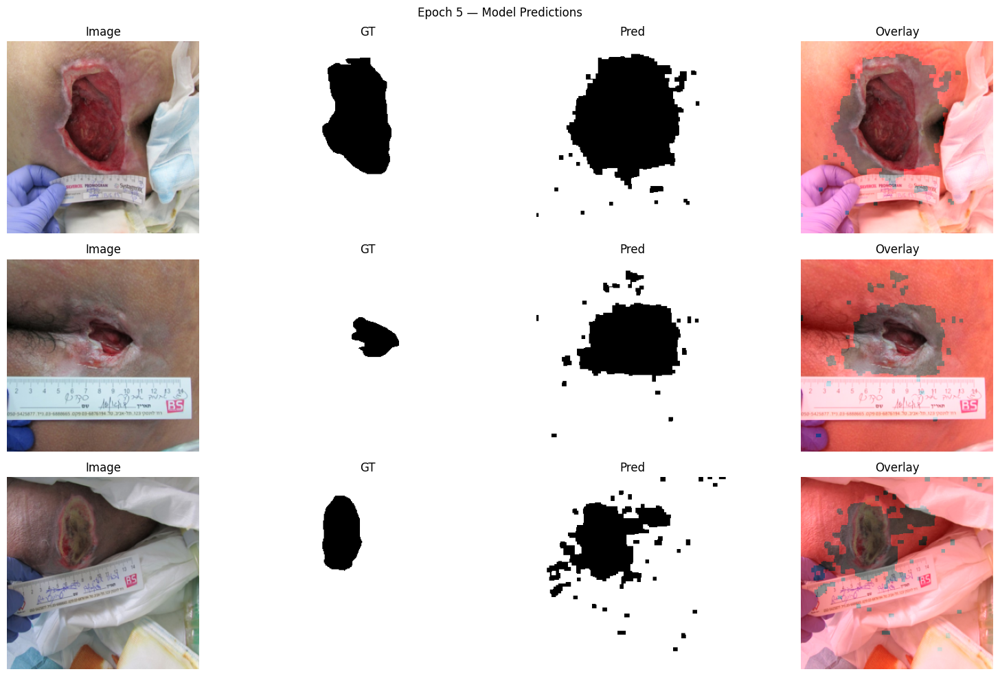

[Epoch 06/50] train_loss=0.4223 | val_loss=0.4022 | val_iou=0.7109
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 07/50] train_loss=0.4176 | val_loss=0.3961 | val_iou=0.7440
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 08/50] train_loss=0.4174 | val_loss=0.3940 | val_iou=0.7777
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 09/50] train_loss=0.4175 | val_loss=0.3886 | val_iou=0.7902
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 10/50] train_loss=0.4060 | val_loss=0.3930 | val_iou=0.8071
⚠️ No improvement (1/12)


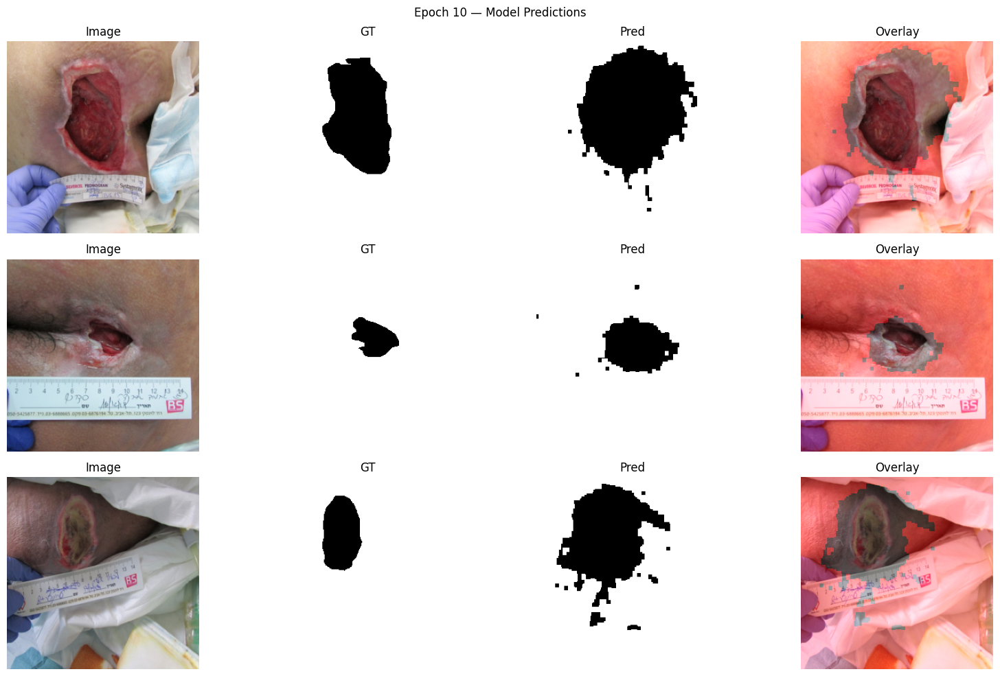

[Epoch 11/50] train_loss=0.4046 | val_loss=0.3909 | val_iou=0.8215
⚠️ No improvement (2/12)


[Epoch 12/50] train_loss=0.3955 | val_loss=0.3789 | val_iou=0.8444
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 13/50] train_loss=0.4001 | val_loss=0.3787 | val_iou=0.8576
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 14/50] train_loss=0.3891 | val_loss=0.3708 | val_iou=0.8840
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 15/50] train_loss=0.3865 | val_loss=0.3688 | val_iou=0.8882
✅ Saved new best model to unet_resnet101_best.pt


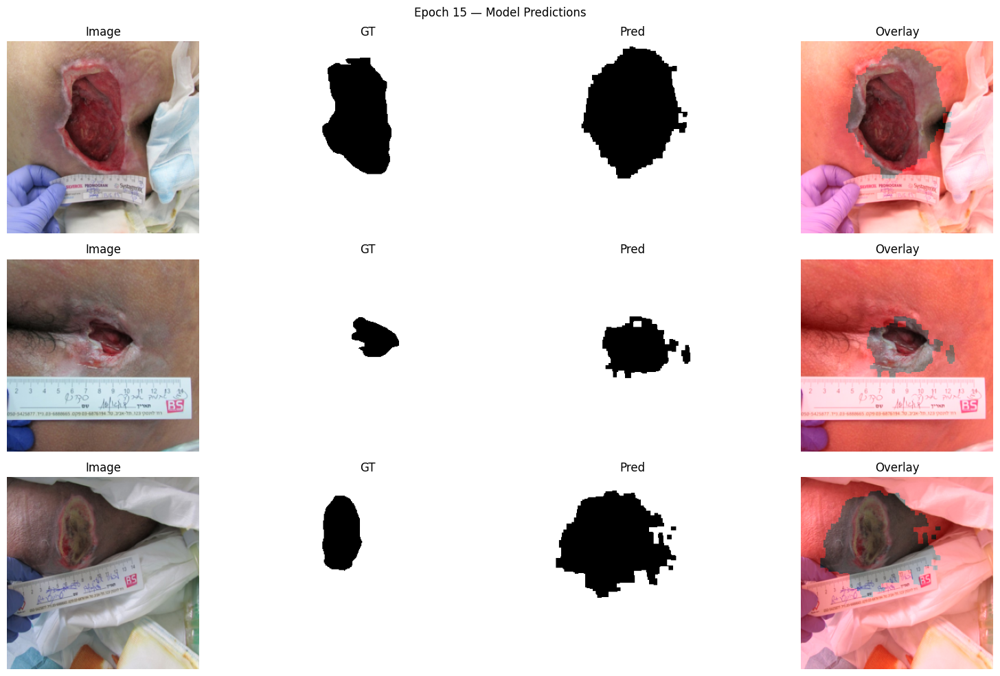

[Epoch 16/50] train_loss=0.3822 | val_loss=0.3635 | val_iou=0.9072
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 17/50] train_loss=0.3731 | val_loss=0.3558 | val_iou=0.9059
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 18/50] train_loss=0.3799 | val_loss=0.3526 | val_iou=0.9115
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 19/50] train_loss=0.3699 | val_loss=0.3497 | val_iou=0.9164
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 20/50] train_loss=0.3654 | val_loss=0.3456 | val_iou=0.9191
✅ Saved new best model to unet_resnet101_best.pt


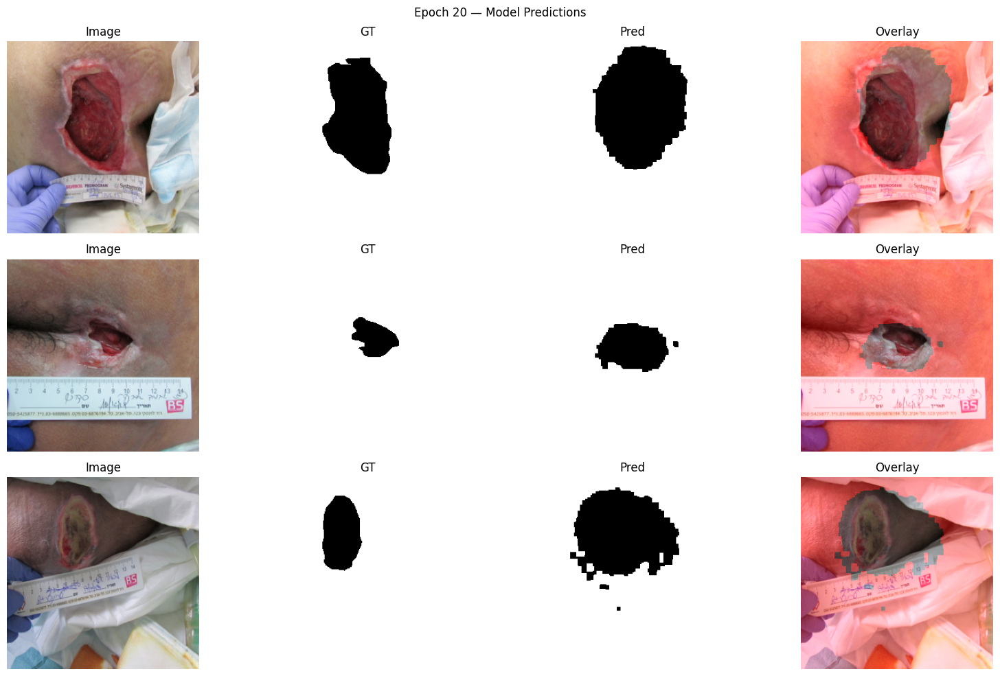

[Epoch 21/50] train_loss=0.3651 | val_loss=0.3422 | val_iou=0.9258
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 22/50] train_loss=0.3675 | val_loss=0.3461 | val_iou=0.9247
⚠️ No improvement (1/12)


[Epoch 23/50] train_loss=0.3658 | val_loss=0.3376 | val_iou=0.9324
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 24/50] train_loss=0.3585 | val_loss=0.3402 | val_iou=0.9290
⚠️ No improvement (1/12)


[Epoch 25/50] train_loss=0.3511 | val_loss=0.3379 | val_iou=0.9265
⚠️ No improvement (2/12)


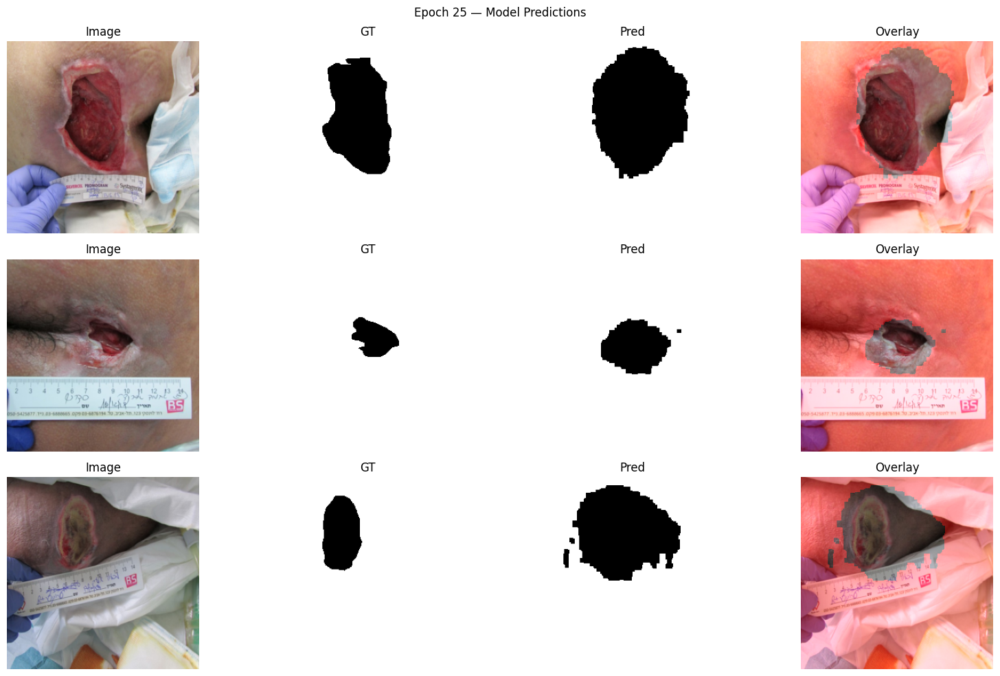

[Epoch 26/50] train_loss=0.3511 | val_loss=0.3336 | val_iou=0.9325
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 27/50] train_loss=0.3535 | val_loss=0.3298 | val_iou=0.9395
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 28/50] train_loss=0.3507 | val_loss=0.3262 | val_iou=0.9288
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 29/50] train_loss=0.3378 | val_loss=0.3231 | val_iou=0.9398
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 30/50] train_loss=0.3437 | val_loss=0.3260 | val_iou=0.9386
⚠️ No improvement (1/12)


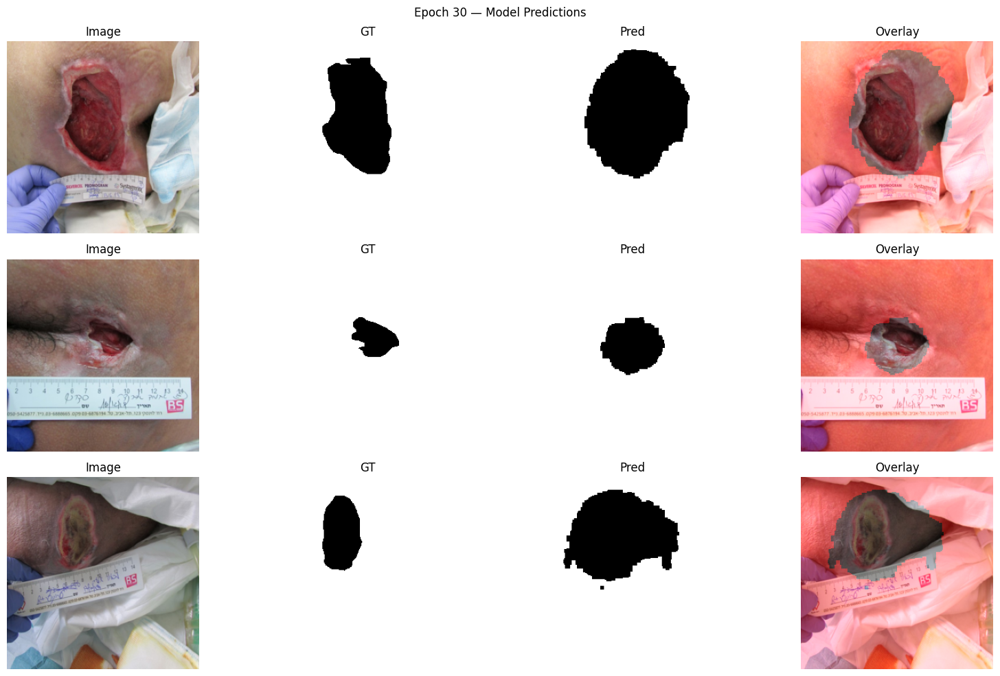

[Epoch 31/50] train_loss=0.3398 | val_loss=0.3233 | val_iou=0.9457
⚠️ No improvement (2/12)


[Epoch 32/50] train_loss=0.3376 | val_loss=0.3294 | val_iou=0.9468
⚠️ No improvement (3/12)


[Epoch 33/50] train_loss=0.3339 | val_loss=0.3282 | val_iou=0.9490
⚠️ No improvement (4/12)


[Epoch 34/50] train_loss=0.3446 | val_loss=0.3227 | val_iou=0.9434
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 35/50] train_loss=0.3315 | val_loss=0.3180 | val_iou=0.9487
✅ Saved new best model to unet_resnet101_best.pt


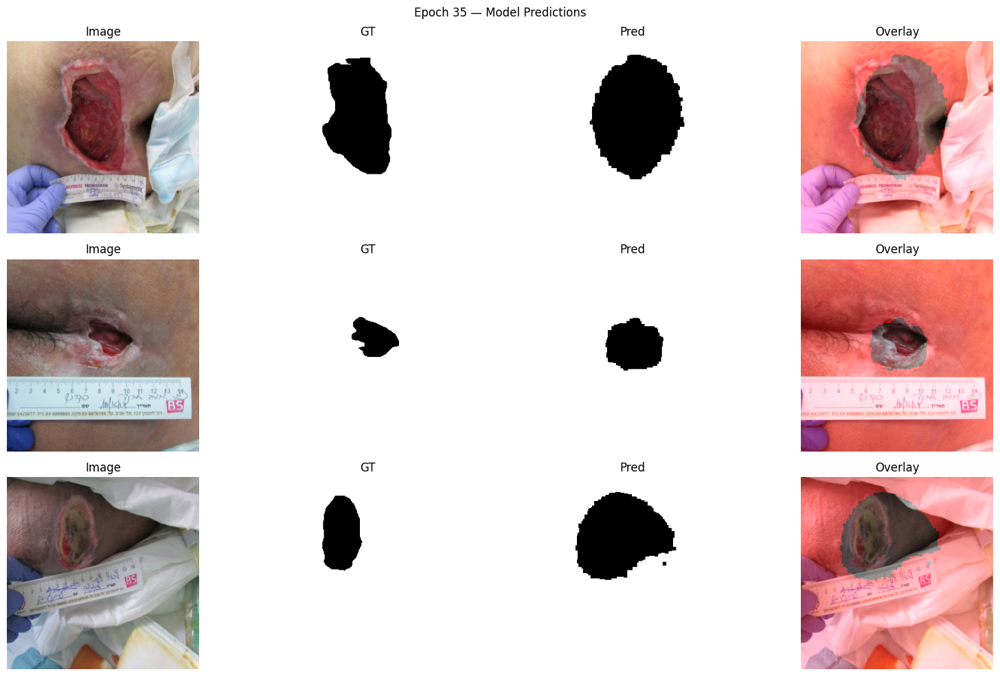

[Epoch 36/50] train_loss=0.3330 | val_loss=0.3140 | val_iou=0.9516
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 37/50] train_loss=0.3298 | val_loss=0.3152 | val_iou=0.9501
⚠️ No improvement (1/12)


[Epoch 38/50] train_loss=0.3325 | val_loss=0.3180 | val_iou=0.9477
⚠️ No improvement (2/12)


[Epoch 39/50] train_loss=0.3232 | val_loss=0.3140 | val_iou=0.9531
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 40/50] train_loss=0.3379 | val_loss=0.3153 | val_iou=0.9494
⚠️ No improvement (1/12)


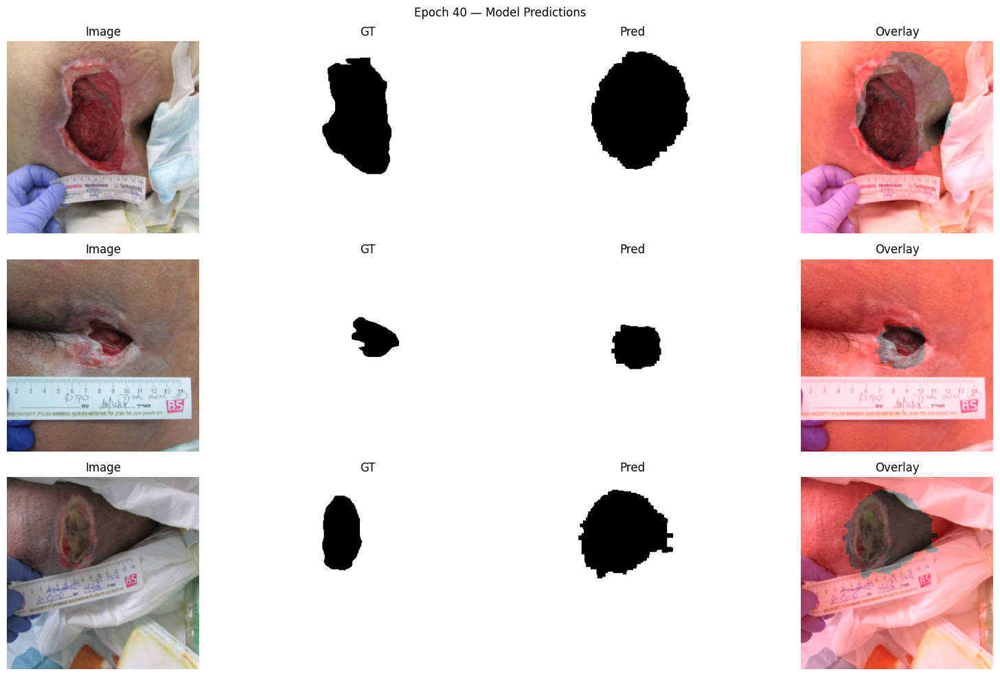

[Epoch 41/50] train_loss=0.3249 | val_loss=0.3157 | val_iou=0.9529
⚠️ No improvement (2/12)


[Epoch 42/50] train_loss=0.3360 | val_loss=0.3064 | val_iou=0.9594
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 43/50] train_loss=0.3181 | val_loss=0.3052 | val_iou=0.9540
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 44/50] train_loss=0.3251 | val_loss=0.3074 | val_iou=0.9561
⚠️ No improvement (1/12)


[Epoch 45/50] train_loss=0.3207 | val_loss=0.3053 | val_iou=0.9561
⚠️ No improvement (2/12)


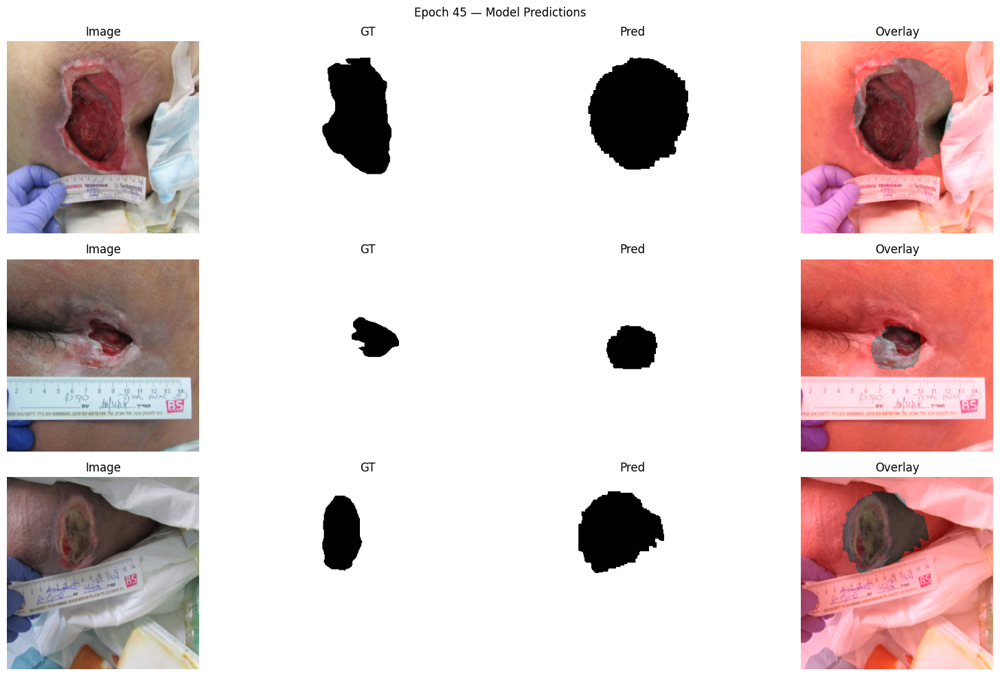

[Epoch 46/50] train_loss=0.3177 | val_loss=0.3054 | val_iou=0.9461
⚠️ No improvement (3/12)


[Epoch 47/50] train_loss=0.3183 | val_loss=0.3041 | val_iou=0.9569
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 48/50] train_loss=0.3212 | val_loss=0.3056 | val_iou=0.9529
⚠️ No improvement (1/12)


[Epoch 49/50] train_loss=0.3237 | val_loss=0.3058 | val_iou=0.9475
⚠️ No improvement (2/12)


[Epoch 50/50] train_loss=0.3228 | val_loss=0.3001 | val_iou=0.9559
✅ Saved new best model to unet_resnet101_best.pt


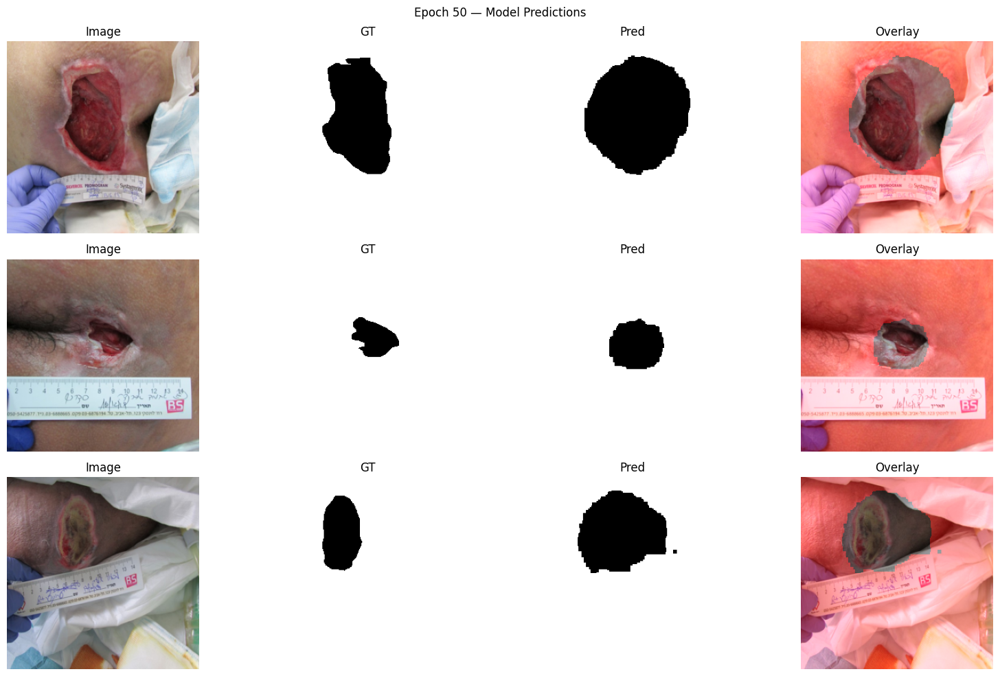

In [12]:
# ========================================
# 🧠 U-Net ResNet101 (Color-Aware + Attention)
# ========================================
import segmentation_models_pytorch as smp
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch_directml
from torchvision import transforms

device = "privateuseone:0" if torch_directml.is_available() else "cpu"
print(f"✅ Using device: {device}")

# ---- Model ----
class UNetResNet101_Attention(nn.Module):
    def __init__(self):
        super().__init__()
        self.base = smp.Unet(
            encoder_name="resnet101",
            encoder_weights="imagenet",
            in_channels=3,
            classes=1,
            activation=None
        )
        self.dropout = nn.Dropout2d(0.3)
        self.se = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(1, 1, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.base(x)
        w = self.se(x)
        x = x * w
        x = self.dropout(x)
        return x

model = UNetResNet101_Attention().to(device)

# ---- Loss Functions ----
def focal_tversky_loss(logits, targets, alpha=0.7, beta=0.3, gamma=1.4, eps=1e-6):
    p = torch.sigmoid(logits)
    tp = (p * targets).sum(dim=(2,3))
    fp = ((1 - targets) * p).sum(dim=(2,3))
    fn = (targets * (1 - p)).sum(dim=(2,3))
    tversky = (tp + eps) / (tp + alpha*fp + beta*fn + eps)
    return ((1 - tversky) ** gamma).mean()

def weighted_bce_loss(logits, targets, w_neg=3.0, w_pos=1.0):
    weights = torch.where(targets > 0.5,
                          torch.tensor(w_pos, device=logits.device),
                          torch.tensor(w_neg, device=logits.device))
    return F.binary_cross_entropy_with_logits(logits, targets, weight=weights)

def color_contrast_loss(imgs, logits):
    """Encourage color distinction between predicted wound vs. skin"""
    p = torch.sigmoid(logits)
    pred_mask = (p > 0.5).float()
    lab_imgs = imgs.permute(0,2,3,1).cpu().numpy()
    losses = []
    for i in range(len(lab_imgs)):
        lab = cv2.cvtColor((lab_imgs[i]*255).astype(np.uint8), cv2.COLOR_RGB2LAB)
        wound = lab[pred_mask[i,0].cpu().numpy() > 0.5]
        skin  = lab[pred_mask[i,0].cpu().numpy() <= 0.5]
        if len(wound)==0 or len(skin)==0: continue
        mean_wound, mean_skin = wound.mean(axis=0), skin.mean(axis=0)
        diff = np.linalg.norm(mean_wound - mean_skin)
        losses.append(np.exp(-diff/50))  # lower loss for greater color diff
    return torch.tensor(losses, device=logits.device).mean() if losses else 0.0

def loss_fn(imgs, logits, targets):
    return (
        0.5 * focal_tversky_loss(logits, targets)
        + 0.3 * weighted_bce_loss(logits, targets)
        + 0.2 * color_contrast_loss(imgs, logits)
    )

@torch.no_grad()
def iou_score(logits, y, thr=0.5, eps=1e-6):
    p = (torch.sigmoid(logits) > thr).float()
    inter = (p * y).sum(dim=(2,3))
    union = (p + y - p*y).sum(dim=(2,3)) + eps
    return (inter / union).mean().item()

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-5, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.5, patience=5)

EPOCHS = 50
PATIENCE = 12
best_val = float('inf')
patience_counter = 0
save_path = "unet_resnet101_best.pt"

# ========================================
# 🔁 Training Loop
# ========================================
for epoch in range(1, EPOCHS + 1):
    model.train()
    total_loss = 0.0
    for x, y, _ in tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS}", leave=False):
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad(set_to_none=True)
        logits = model(x)
        loss = loss_fn(x, logits, y)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)
        optimizer.step()
        total_loss += loss.item() * x.size(0)
    train_loss = total_loss / len(train_ds)

    # Validation
    model.eval()
    val_loss, val_iou = 0.0, 0.0
    with torch.no_grad():
        for x, y, _ in val_loader:
            x, y = x.to(device), y.to(device)
            logits = model(x)
            val_loss += loss_fn(x, logits, y).item() * x.size(0)
            val_iou += iou_score(logits, y, thr=0.5) * x.size(0)
    val_loss /= len(val_ds)
    val_iou /= len(val_ds)
    scheduler.step(val_loss)

    print(f"[Epoch {epoch:02d}/{EPOCHS}] train_loss={train_loss:.4f} | val_loss={val_loss:.4f} | val_iou={val_iou:.4f}")
    if val_loss < best_val:
        best_val = val_loss
        patience_counter = 0
        torch.save(model.state_dict(), save_path)
        print(f"✅ Saved new best model to {save_path}")
    else:
        patience_counter += 1
        print(f"⚠️ No improvement ({patience_counter}/{PATIENCE})")
        if patience_counter >= PATIENCE:
            print("⏹ Early stopping.")
            break

    # Visualization
    if epoch % 5 == 0:
        model.eval()
        imgs, masks, _ = next(iter(val_loader))
        imgs, masks = imgs.to(device), masks.to(device)
        preds = torch.sigmoid(model(imgs))

        fig, axes = plt.subplots(3, 4, figsize=(16, 10))
        for i in range(min(3, len(imgs))):
            pred = preds[i].detach().cpu().squeeze().numpy()
            pred = (pred > 0.5).astype(np.uint8)
            kernel = np.ones((5,5), np.uint8)
            pred = cv2.morphologyEx(pred, cv2.MORPH_CLOSE, kernel)
            pred = cv2.morphologyEx(pred, cv2.MORPH_OPEN, kernel)

            overlay = imgs[i].cpu().permute(1,2,0).numpy().copy()
            overlay = (overlay * 255).astype(np.uint8)
            overlay_mask = np.stack([pred*255, np.zeros_like(pred), np.zeros_like(pred)], axis=2)
            overlay = cv2.addWeighted(overlay, 1.0, overlay_mask, 0.4, 0)

            axes[i,0].imshow(imgs[i].cpu().permute(1,2,0))
            axes[i,0].set_title("Image"); axes[i,0].axis("off")
            axes[i,1].imshow(masks[i].cpu().squeeze(), cmap="gray")
            axes[i,1].set_title("GT"); axes[i,1].axis("off")
            axes[i,2].imshow(pred, cmap="gray")
            axes[i,2].set_title("Pred"); axes[i,2].axis("off")
            axes[i,3].imshow(overlay)
            axes[i,3].set_title("Overlay"); axes[i,3].axis("off")

        plt.suptitle(f"Epoch {epoch} — Model Predictions")
        plt.tight_layout()
        plt.show()


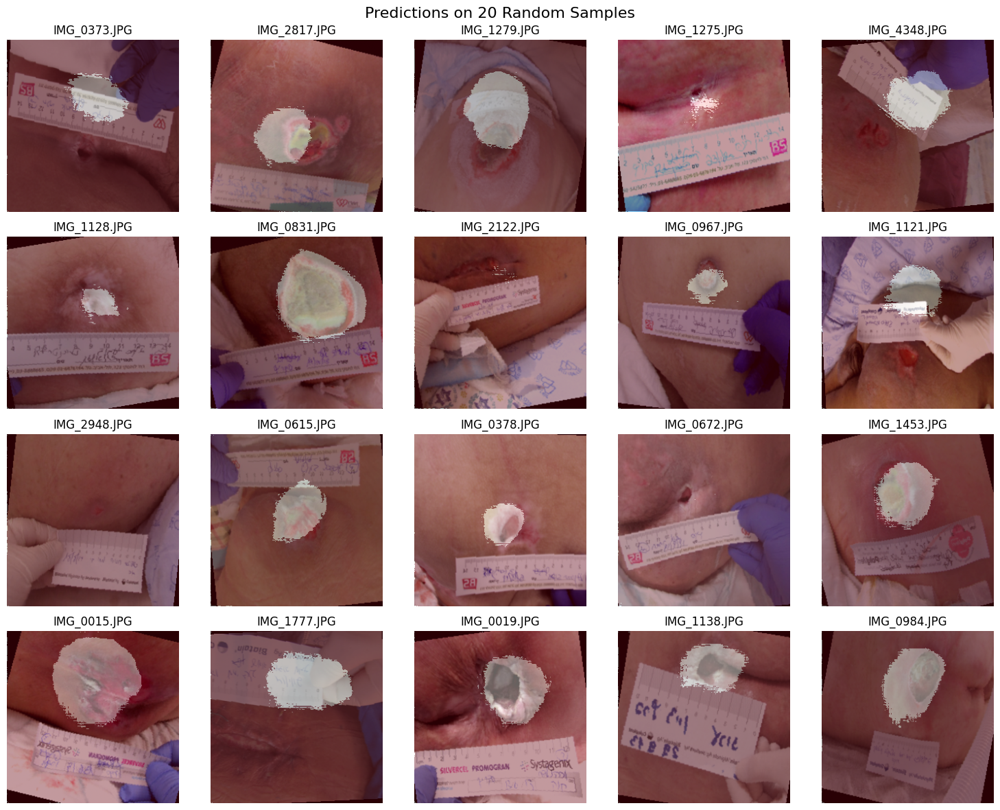

In [13]:
import random
import matplotlib.pyplot as plt

# ✅ הגדרה: הצגת N תמונות רנדומליות מה-dataset (train או val)
def show_random_predictions(model, dataset, n=20, device='cpu', thr=0.5):
    model.eval()
    indices = random.sample(range(len(dataset)), k=min(n, len(dataset)))
    n_rows = (n + 4) // 5  # כל שורה תציג 5 תמונות
    fig, axes = plt.subplots(n_rows, 5, figsize=(15, 3 * n_rows))

    if n_rows == 1:
        axes = np.expand_dims(axes, 0)

    for i, idx in enumerate(indices):
        img, mask, path = dataset[idx]
        img_in = img.unsqueeze(0).to(device)

        with torch.no_grad():
            pred = torch.sigmoid(model(img_in)).squeeze().cpu().numpy()

        pred_bin = (pred > thr).astype(float)
        img_np = img.permute(1,2,0).numpy()
        mask_np = mask.squeeze().numpy()

        ax = axes[i // 5, i % 5]
        ax.imshow(img_np)
        ax.imshow(pred_bin, cmap="Reds", alpha=0.4)
        ax.set_title(f"{os.path.basename(path)}")
        ax.axis("off")

    plt.suptitle(f"Predictions on {n} Random Samples", fontsize=16)
    plt.tight_layout()
    plt.show()

# ✅ קריאה לדוגמה – מתוך קבוצת האימון:
show_random_predictions(model, train_ds, n=20, device=device)

# או אם תרצה דווקא מהוולידציה:
# show_random_predictions(model, val_ds, n=20, device=device)


מודל שני עם צמצום שטח תמונה ואז מודל כמו שלנו


In [22]:
# ========================================
# ✂️ AUTO-CROP WOUND REGIONS (HSV-based ROI)
# ========================================
import os, re, glob, random, cv2
import numpy as np
from pathlib import Path
from typing import List, Tuple, Dict
from tqdm import tqdm

# === נתיב ראשי לכל התמונות והמאסקים ===
ROOT_DIR = Path(r"C:\Users\Reuth\anaconda_projects\image_project\photos_for_tags_algo")

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

# === עזרי ניתוח שמות קבצים ===
def normalize_stem(stem: str) -> str:
    """מסיר סיומות כמו _MASK/_mask/_MARKED משם הקובץ"""
    return re.sub(r'(?i)_(mask|marked)$', '', stem)

def is_marked(stem: str) -> bool:
    return re.search(r'(?i)_marked$', stem) is not None

def is_mask(stem: str) -> bool:
    return re.search(r'(?i)_mask$', stem) is not None

# === סריקה רקורסיבית לכל זוגות התמונה-מאסק ===
def scan_pairs(root: Path) -> List[Tuple[Path, Path]]:
    files = [Path(p) for p in glob.glob(str(root / "**" / "*"), recursive=True)]
    files = [p for p in files if p.is_file() and p.suffix.lower() in IMG_EXTS]
    by_base: Dict[str, Dict[str, Path]] = {}
    for p in files:
        stem = p.stem
        base = normalize_stem(stem)
        if is_marked(stem):
            continue
        entry = by_base.setdefault(base, {})
        if is_mask(stem):
            entry["mask"] = p
        else:
            entry["img"] = p
    return [(rec["img"], rec["mask"]) for rec in by_base.values() if "img" in rec and "mask" in rec]

pairs = scan_pairs(ROOT_DIR)
print(f"🧩 Found {len(pairs)} image-mask pairs")

# === נתיבים לתיקיות החדשות ===
CROP_IMG_DIR = ROOT_DIR / "cropped_images"
CROP_MASK_DIR = ROOT_DIR / "cropped_masks"
os.makedirs(CROP_IMG_DIR, exist_ok=True)
os.makedirs(CROP_MASK_DIR, exist_ok=True)

# === פונקציה לאיתור ROI לפי צבע (HSV) ===
def detect_wound_hsv(image_rgb):
    hsv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HSV)
    lower_red1, upper_red1 = np.array([0, 60, 40]), np.array([15, 255, 255])
    lower_red2, upper_red2 = np.array([160, 60, 40]), np.array([179, 255, 255])
    lower_yellow, upper_yellow = np.array([16, 30, 80]), np.array([40, 255, 255])

    mask = (cv2.inRange(hsv, lower_red1, upper_red1) |
            cv2.inRange(hsv, lower_red2, upper_red2) |
            cv2.inRange(hsv, lower_yellow, upper_yellow))
    mask = cv2.medianBlur(mask, 7)
    kernel = np.ones((15, 15), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return None

    c = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(c)

    # הוספת padding מסביב לפצע (כ־10%)
    pad = int(0.1 * max(w, h))
    x1, y1 = max(0, x - pad), max(0, y - pad)
    x2, y2 = min(image_rgb.shape[1], x + w + pad), min(image_rgb.shape[0], y + h + pad)
    return (x1, y1, x2, y2)

# === חיתוך כל התמונות והמאסקים ===
for img_path, mask_path in tqdm(pairs, desc="Cropping wounds"):
    img = cv2.imread(str(img_path))
    mask = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
    if img is None or mask is None:
        continue

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    box = detect_wound_hsv(img_rgb)
    if box is None:
        continue

    x1, y1, x2, y2 = box
    cropped_img = img[y1:y2, x1:x2]
    cropped_mask = mask[y1:y2, x1:x2]

    cv2.imwrite(str(CROP_IMG_DIR / img_path.name), cropped_img)
    cv2.imwrite(str(CROP_MASK_DIR / mask_path.name), cropped_mask)

print(f"✅ Cropping complete. Files saved to:\n  {CROP_IMG_DIR}\n  {CROP_MASK_DIR}")


🧩 Found 143 image-mask pairs


Cropping wounds: 100%|██████████| 143/143 [00:11<00:00, 12.32it/s]

✅ Cropping complete. Files saved to:
  C:\Users\Reuth\anaconda_projects\image_project\photos_for_tags_algo\cropped_images
  C:\Users\Reuth\anaconda_projects\image_project\photos_for_tags_algo\cropped_masks


✅ Using device: privateuseone:0
🧩 Found 143 cropped image-mask pairs
Train: 115  |  Val: 28


[Epoch 01/50] train_loss=0.4753 | val_loss=0.4352 | val_iou=0.5531
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 02/50] train_loss=0.4261 | val_loss=0.3860 | val_iou=0.6210
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 03/50] train_loss=0.4170 | val_loss=0.3838 | val_iou=0.7187
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 04/50] train_loss=0.3994 | val_loss=0.3730 | val_iou=0.8116
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 05/50] train_loss=0.3941 | val_loss=0.3544 | val_iou=0.8619
✅ Saved new best model to unet_resnet101_best.pt


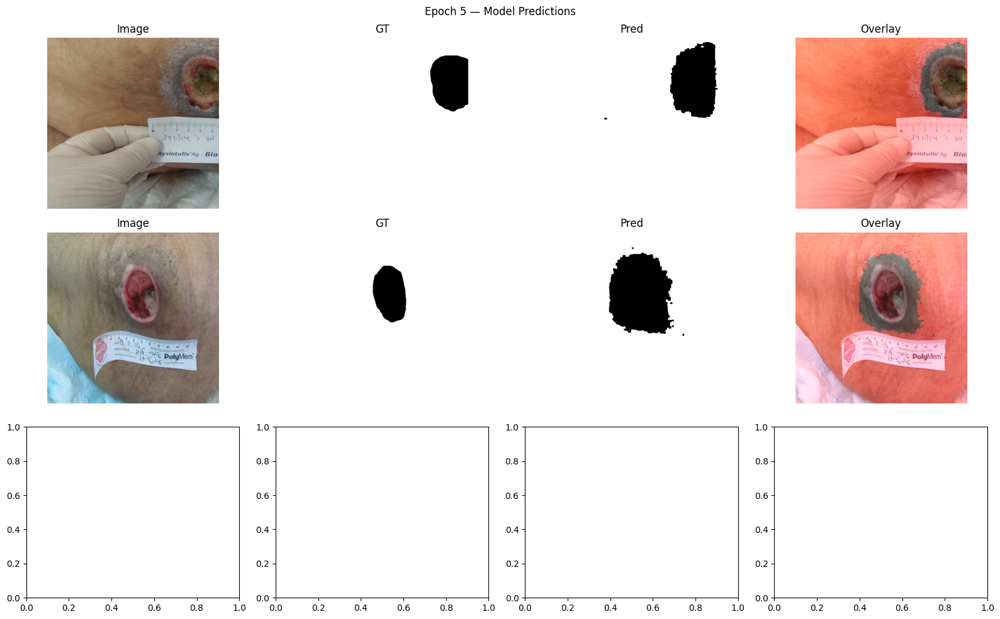

[Epoch 06/50] train_loss=0.3790 | val_loss=0.3432 | val_iou=0.8952
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 07/50] train_loss=0.3689 | val_loss=0.3389 | val_iou=0.9095
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 08/50] train_loss=0.3577 | val_loss=0.3330 | val_iou=0.9281
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 09/50] train_loss=0.3637 | val_loss=0.3352 | val_iou=0.9141
⚠️ No improvement (1/12)


[Epoch 10/50] train_loss=0.3628 | val_loss=0.3369 | val_iou=0.9076
⚠️ No improvement (2/12)


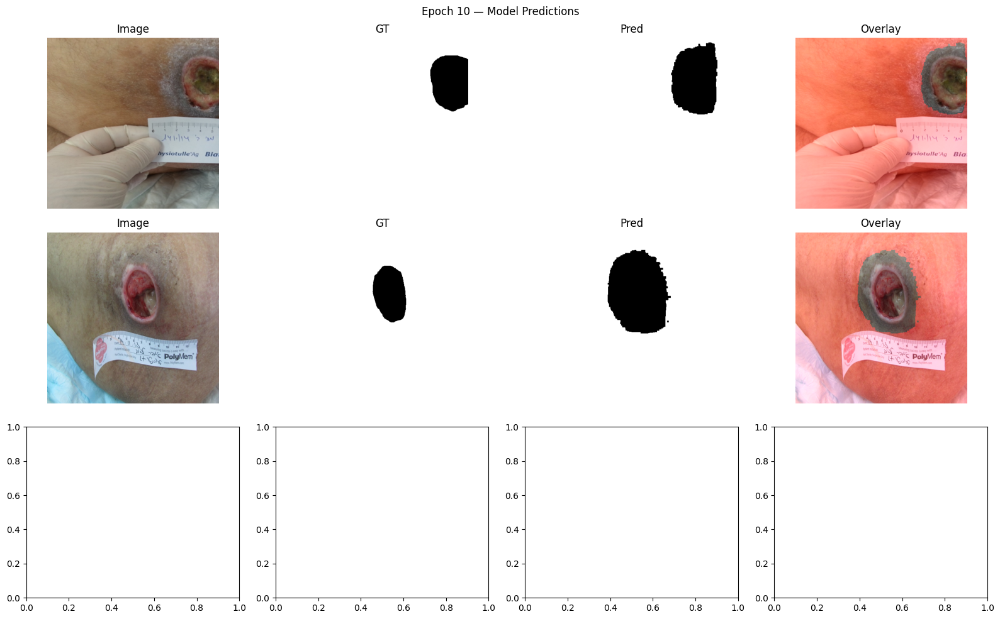

[Epoch 11/50] train_loss=0.3566 | val_loss=0.3262 | val_iou=0.9333
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 12/50] train_loss=0.3551 | val_loss=0.3254 | val_iou=0.9194
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 13/50] train_loss=0.3588 | val_loss=0.3271 | val_iou=0.9206
⚠️ No improvement (1/12)


[Epoch 14/50] train_loss=0.3632 | val_loss=0.3278 | val_iou=0.9182
⚠️ No improvement (2/12)


[Epoch 15/50] train_loss=0.3586 | val_loss=0.3266 | val_iou=0.9101
⚠️ No improvement (3/12)


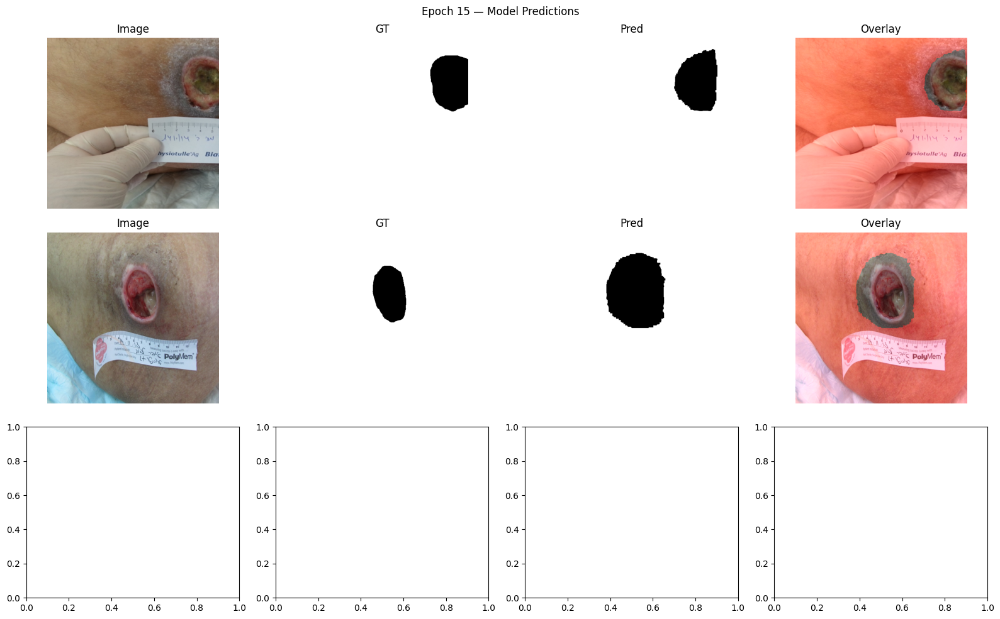

[Epoch 16/50] train_loss=0.3569 | val_loss=0.3244 | val_iou=0.9133
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 17/50] train_loss=0.3595 | val_loss=0.3257 | val_iou=0.9203
⚠️ No improvement (1/12)


[Epoch 18/50] train_loss=0.3520 | val_loss=0.3223 | val_iou=0.9232
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 19/50] train_loss=0.3458 | val_loss=0.3244 | val_iou=0.9260
⚠️ No improvement (1/12)


[Epoch 20/50] train_loss=0.3510 | val_loss=0.3196 | val_iou=0.9234
✅ Saved new best model to unet_resnet101_best.pt


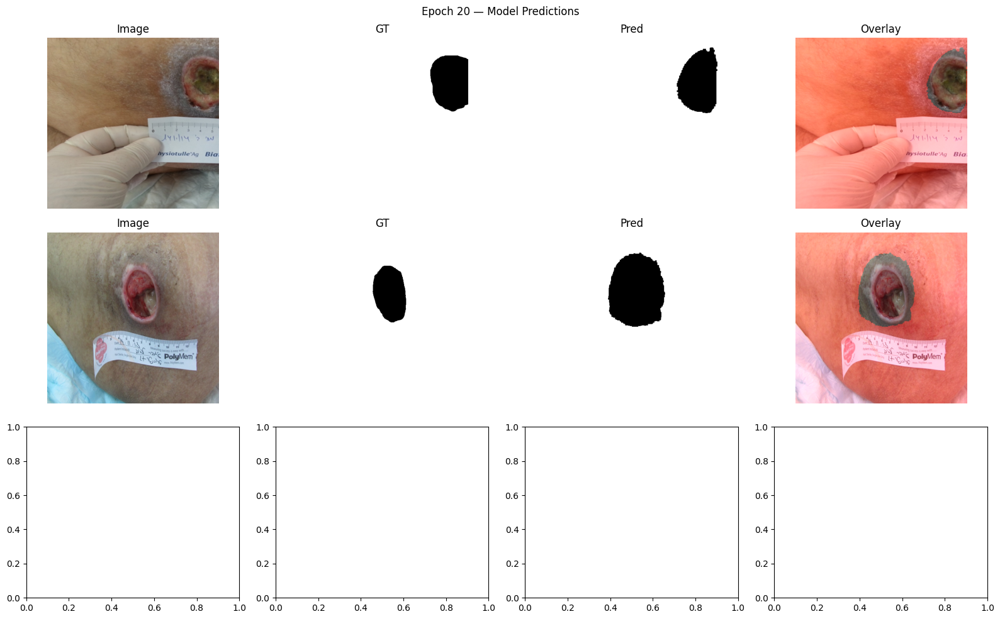

[Epoch 21/50] train_loss=0.3459 | val_loss=0.3251 | val_iou=0.9211
⚠️ No improvement (1/12)


[Epoch 22/50] train_loss=0.3403 | val_loss=0.3221 | val_iou=0.9250
⚠️ No improvement (2/12)


[Epoch 23/50] train_loss=0.3494 | val_loss=0.3283 | val_iou=0.9217
⚠️ No improvement (3/12)


[Epoch 24/50] train_loss=0.3350 | val_loss=0.3226 | val_iou=0.9413
⚠️ No improvement (4/12)


[Epoch 25/50] train_loss=0.3460 | val_loss=0.3159 | val_iou=0.9224
✅ Saved new best model to unet_resnet101_best.pt


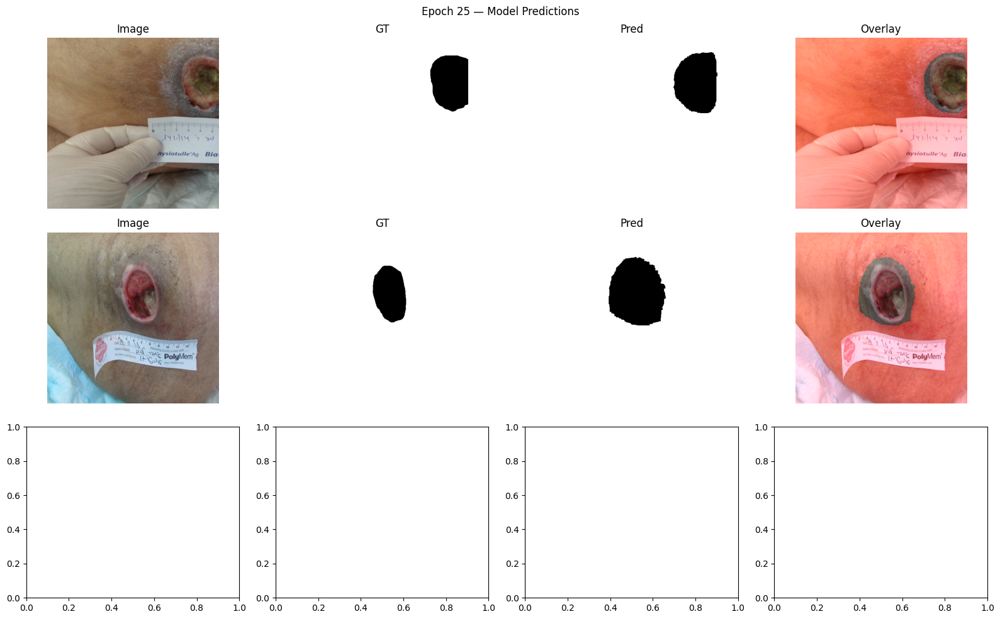

[Epoch 26/50] train_loss=0.3506 | val_loss=0.3222 | val_iou=0.9146
⚠️ No improvement (1/12)


[Epoch 27/50] train_loss=0.3451 | val_loss=0.3245 | val_iou=0.9182
⚠️ No improvement (2/12)


[Epoch 28/50] train_loss=0.3490 | val_loss=0.3144 | val_iou=0.9294
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 29/50] train_loss=0.3476 | val_loss=0.3204 | val_iou=0.9267
⚠️ No improvement (1/12)


[Epoch 30/50] train_loss=0.3525 | val_loss=0.3175 | val_iou=0.9283
⚠️ No improvement (2/12)


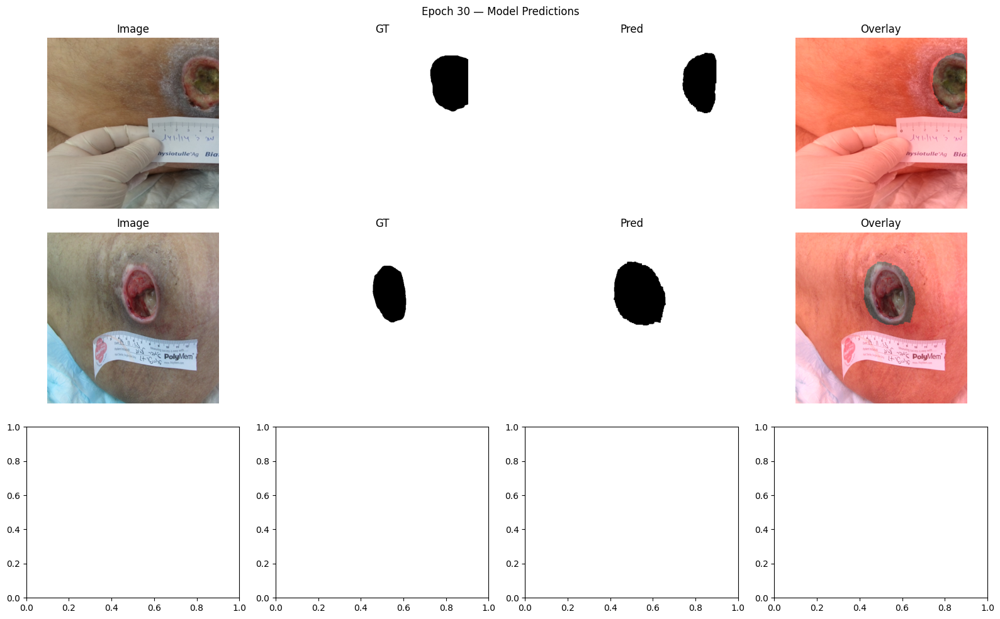

[Epoch 31/50] train_loss=0.3392 | val_loss=0.3145 | val_iou=0.9390
⚠️ No improvement (3/12)


[Epoch 32/50] train_loss=0.3341 | val_loss=0.3160 | val_iou=0.9358
⚠️ No improvement (4/12)


[Epoch 33/50] train_loss=0.3387 | val_loss=0.3177 | val_iou=0.9414
⚠️ No improvement (5/12)


[Epoch 34/50] train_loss=0.3442 | val_loss=0.3113 | val_iou=0.9357
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 35/50] train_loss=0.3380 | val_loss=0.3180 | val_iou=0.9285
⚠️ No improvement (1/12)


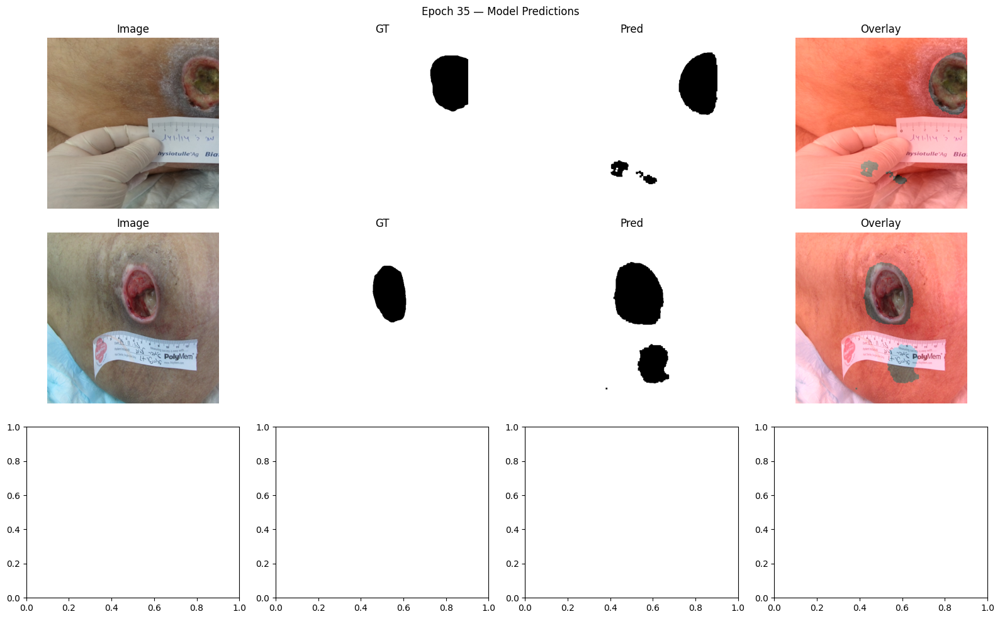

[Epoch 36/50] train_loss=0.3372 | val_loss=0.3146 | val_iou=0.9346
⚠️ No improvement (2/12)


[Epoch 37/50] train_loss=0.3361 | val_loss=0.3112 | val_iou=0.9423
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 38/50] train_loss=0.3353 | val_loss=0.3222 | val_iou=0.9300
⚠️ No improvement (1/12)


[Epoch 39/50] train_loss=0.3305 | val_loss=0.3064 | val_iou=0.9534
✅ Saved new best model to unet_resnet101_best.pt


[Epoch 40/50] train_loss=0.3345 | val_loss=0.3169 | val_iou=0.9517
⚠️ No improvement (1/12)


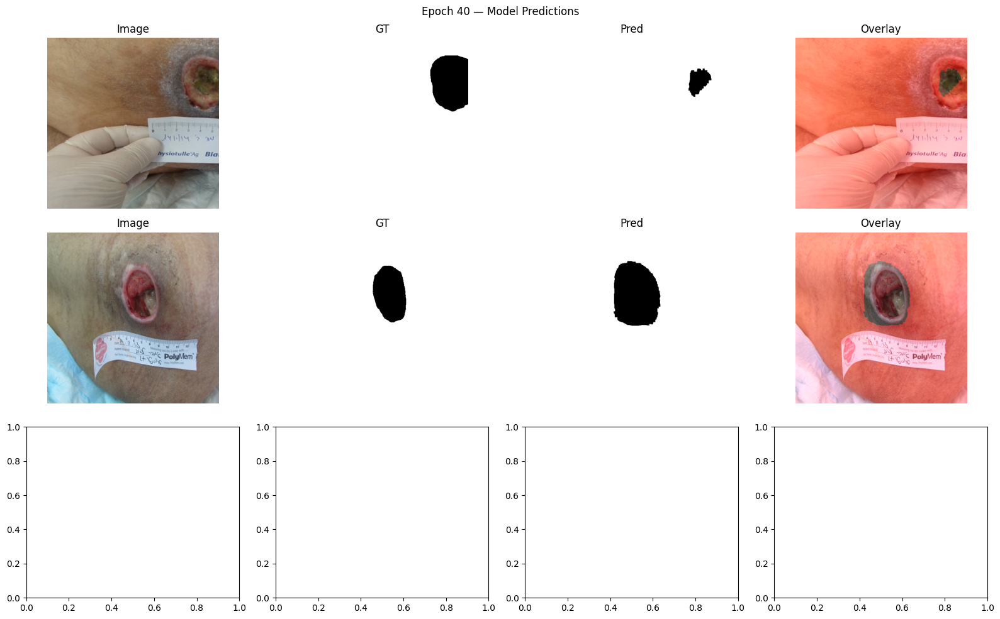

[Epoch 41/50] train_loss=0.3352 | val_loss=0.3200 | val_iou=0.9424
⚠️ No improvement (2/12)


[Epoch 42/50] train_loss=0.3355 | val_loss=0.3201 | val_iou=0.9358
⚠️ No improvement (3/12)


[Epoch 43/50] train_loss=0.3210 | val_loss=0.3198 | val_iou=0.9161
⚠️ No improvement (4/12)


[Epoch 44/50] train_loss=0.3372 | val_loss=0.3319 | val_iou=0.9087
⚠️ No improvement (5/12)


[Epoch 45/50] train_loss=0.3292 | val_loss=0.3118 | val_iou=0.9387
⚠️ No improvement (6/12)


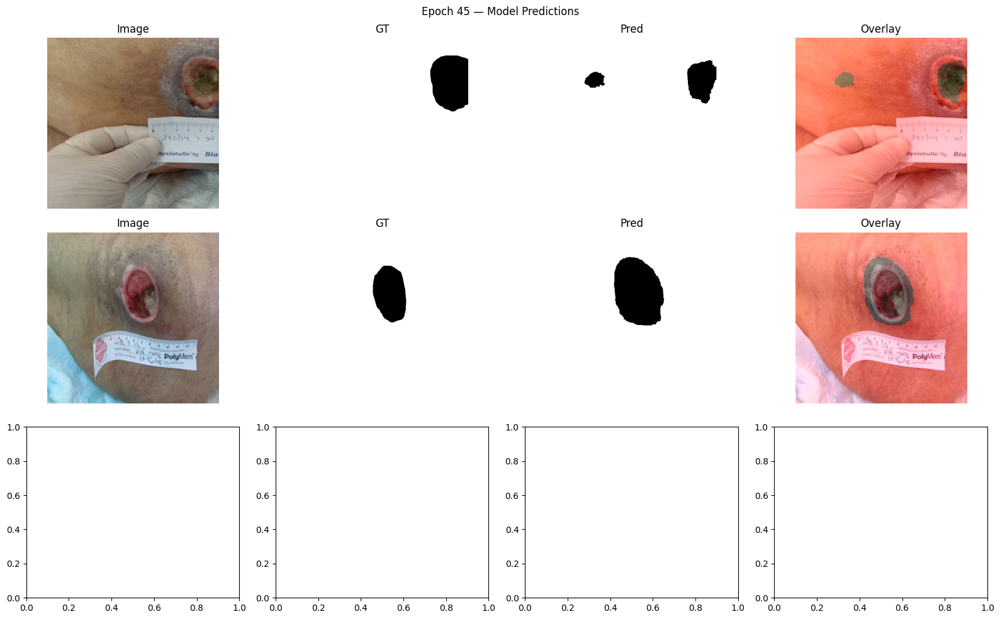

[Epoch 46/50] train_loss=0.3214 | val_loss=0.3095 | val_iou=0.9382
⚠️ No improvement (7/12)


[Epoch 47/50] train_loss=0.3308 | val_loss=0.3117 | val_iou=0.9342
⚠️ No improvement (8/12)


[Epoch 48/50] train_loss=0.3352 | val_loss=0.3149 | val_iou=0.9295
⚠️ No improvement (9/12)


[Epoch 49/50] train_loss=0.3279 | val_loss=0.3170 | val_iou=0.9278
⚠️ No improvement (10/12)


[Epoch 50/50] train_loss=0.3252 | val_loss=0.3082 | val_iou=0.9491
⚠️ No improvement (11/12)


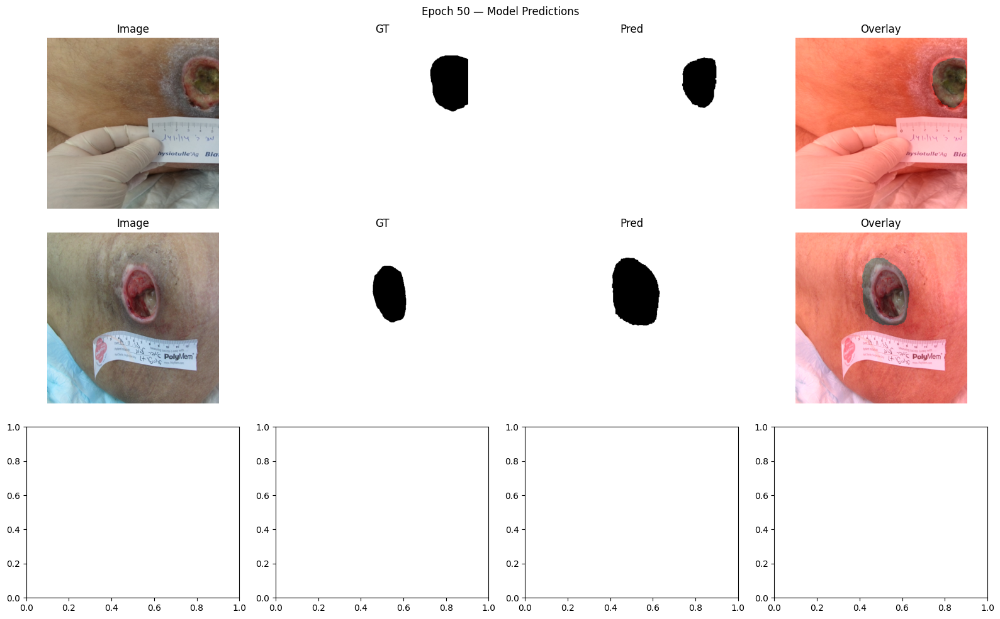

In [23]:
# ========================================
# 🧠 U-Net ResNet101 (Color-Aware + Attention)
# ========================================
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch_directml
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import segmentation_models_pytorch as smp
import random

# ---- Device ----
device = "privateuseone:0" if torch_directml.is_available() else "cpu"
print(f"✅ Using device: {device}")

# ========================================
# 📁 Dataset Paths
# ========================================
ROOT_DIR = r"C:\Users\Reuth\anaconda_projects\image_project\photos_for_tags_algo"
IMG_DIR = os.path.join(ROOT_DIR, "cropped_images")
MASK_DIR = os.path.join(ROOT_DIR, "cropped_masks")

IMG_SIZE = 512
VAL_SPLIT = 0.2
BATCH = 2
RANDOM_SEED = 42

# ========================================
# 🧩 Dataset Definition
# ========================================
class SegDataset(Dataset):
    def __init__(self, pairs, train=True):
        self.pairs = pairs
        self.tf_img = transforms.Compose([
            transforms.Resize((IMG_SIZE, IMG_SIZE)),
            transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.05) if train else transforms.Lambda(lambda x: x),
            transforms.RandomHorizontalFlip(p=0.5) if train else transforms.Lambda(lambda x: x),
            transforms.RandomVerticalFlip(p=0.3) if train else transforms.Lambda(lambda x: x),
            transforms.RandomRotation(15) if train else transforms.Lambda(lambda x: x),
            transforms.ToTensor()
        ])
        self.tf_mask = transforms.Compose([
            transforms.Resize((IMG_SIZE, IMG_SIZE)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        img_path, mask_path = self.pairs[idx]
        img = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")

        img = self.tf_img(img)
        mask = self.tf_mask(mask)
        mask = (mask > 0.5).float()

        return img, mask, str(img_path)

# ========================================
# 🗂️ Prepare Data
# ========================================
def collect_pairs(img_dir, mask_dir):
    img_files = [f for f in os.listdir(img_dir) if f.lower().endswith((".jpg", ".jpeg", ".png"))]
    pairs = []
    for img_name in img_files:
        base = os.path.splitext(img_name)[0]
        possible_masks = [os.path.join(mask_dir, f) for f in os.listdir(mask_dir) if base in f]
        if possible_masks:
            pairs.append((os.path.join(img_dir, img_name), possible_masks[0]))
    return pairs

pairs = collect_pairs(IMG_DIR, MASK_DIR)
print(f"🧩 Found {len(pairs)} cropped image-mask pairs")

random.seed(RANDOM_SEED)
random.shuffle(pairs)
n_total = len(pairs)
n_val = max(1, int(n_total * VAL_SPLIT))
train_pairs, val_pairs = pairs[:-n_val], pairs[-n_val:]

train_ds = SegDataset(train_pairs, train=True)
val_ds   = SegDataset(val_pairs, train=False)

train_loader = DataLoader(train_ds, batch_size=BATCH, shuffle=True, num_workers=0, pin_memory=False)
val_loader   = DataLoader(val_ds,   batch_size=BATCH, shuffle=False, num_workers=0, pin_memory=False)

print(f"Train: {len(train_ds)}  |  Val: {len(val_ds)}")

# ========================================
# 🧠 Model Definition
# ========================================
class UNetResNet101_Attention(nn.Module):
    def __init__(self):
        super().__init__()
        self.base = smp.Unet(
            encoder_name="resnet101",
            encoder_weights="imagenet",
            in_channels=3,
            classes=1,
            activation=None
        )
        self.dropout = nn.Dropout2d(0.3)
        self.se = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(1, 1, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.base(x)
        w = self.se(x)
        x = x * w
        x = self.dropout(x)
        return x

model = UNetResNet101_Attention().to(device)

# ========================================
# ⚙️ Loss Functions
# ========================================
def focal_tversky_loss(logits, targets, alpha=0.7, beta=0.3, gamma=1.4, eps=1e-6):
    p = torch.sigmoid(logits)
    tp = (p * targets).sum(dim=(2,3))
    fp = ((1 - targets) * p).sum(dim=(2,3))
    fn = (targets * (1 - p)).sum(dim=(2,3))
    tversky = (tp + eps) / (tp + alpha*fp + beta*fn + eps)
    return ((1 - tversky) ** gamma).mean()

def weighted_bce_loss(logits, targets, w_neg=3.0, w_pos=1.0):
    weights = torch.where(targets > 0.5,
                          torch.tensor(w_pos, device=logits.device),
                          torch.tensor(w_neg, device=logits.device))
    return F.binary_cross_entropy_with_logits(logits, targets, weight=weights)

def color_contrast_loss(imgs, logits):
    """Encourage color distinction between predicted wound vs. skin"""
    p = torch.sigmoid(logits)
    pred_mask = (p > 0.5).float()
    lab_imgs = imgs.permute(0,2,3,1).cpu().numpy()
    losses = []
    for i in range(len(lab_imgs)):
        lab = cv2.cvtColor((lab_imgs[i]*255).astype(np.uint8), cv2.COLOR_RGB2LAB)
        wound = lab[pred_mask[i,0].cpu().numpy() > 0.5]
        skin  = lab[pred_mask[i,0].cpu().numpy() <= 0.5]
        if len(wound)==0 or len(skin)==0: continue
        mean_wound, mean_skin = wound.mean(axis=0), skin.mean(axis=0)
        diff = np.linalg.norm(mean_wound - mean_skin)
        losses.append(np.exp(-diff/50))  # lower loss for greater color diff
    return torch.tensor(losses, device=logits.device).mean() if losses else 0.0

def loss_fn(imgs, logits, targets):
    return (
        0.5 * focal_tversky_loss(logits, targets)
        + 0.3 * weighted_bce_loss(logits, targets)
        + 0.2 * color_contrast_loss(imgs, logits)
    )

@torch.no_grad()
def iou_score(logits, y, thr=0.5, eps=1e-6):
    p = (torch.sigmoid(logits) > thr).float()
    inter = (p * y).sum(dim=(2,3))
    union = (p + y - p*y).sum(dim=(2,3)) + eps
    return (inter / union).mean().item()

# ========================================
# 🚀 Optimizer & Scheduler
# ========================================
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-5, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.5, patience=5)

EPOCHS = 50
PATIENCE = 12
best_val = float('inf')
patience_counter = 0
save_path = "unet_resnet101_best.pt"

# ========================================
# 🔁 Training Loop
# ========================================
for epoch in range(1, EPOCHS + 1):
    model.train()
    total_loss = 0.0
    for x, y, _ in tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS}", leave=False):
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad(set_to_none=True)
        logits = model(x)
        loss = loss_fn(x, logits, y)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)
        optimizer.step()
        total_loss += loss.item() * x.size(0)
    train_loss = total_loss / len(train_ds)

    # Validation
    model.eval()
    val_loss, val_iou = 0.0, 0.0
    with torch.no_grad():
        for x, y, _ in val_loader:
            x, y = x.to(device), y.to(device)
            logits = model(x)
            val_loss += loss_fn(x, logits, y).item() * x.size(0)
            val_iou += iou_score(logits, y, thr=0.5) * x.size(0)
    val_loss /= len(val_ds)
    val_iou /= len(val_ds)
    scheduler.step(val_loss)

    print(f"[Epoch {epoch:02d}/{EPOCHS}] train_loss={train_loss:.4f} | val_loss={val_loss:.4f} | val_iou={val_iou:.4f}")
    if val_loss < best_val:
        best_val = val_loss
        patience_counter = 0
        torch.save(model.state_dict(), save_path)
        print(f"✅ Saved new best model to {save_path}")
    else:
        patience_counter += 1
        print(f"⚠️ No improvement ({patience_counter}/{PATIENCE})")
        if patience_counter >= PATIENCE:
            print("⏹ Early stopping.")
            break

    # Visualization every 5 epochs
    if epoch % 5 == 0:
        model.eval()
        imgs, masks, _ = next(iter(val_loader))
        imgs, masks = imgs.to(device), masks.to(device)
        preds = torch.sigmoid(model(imgs))

        fig, axes = plt.subplots(3, 4, figsize=(16, 10))
        for i in range(min(3, len(imgs))):
            pred = preds[i].detach().cpu().squeeze().numpy()
            pred = (pred > 0.5).astype(np.uint8)
            kernel = np.ones((5,5), np.uint8)
            pred = cv2.morphologyEx(pred, cv2.MORPH_CLOSE, kernel)
            pred = cv2.morphologyEx(pred, cv2.MORPH_OPEN, kernel)

            overlay = imgs[i].cpu().permute(1,2,0).numpy().copy()
            overlay = (overlay * 255).astype(np.uint8)
            overlay_mask = np.stack([pred*255, np.zeros_like(pred), np.zeros_like(pred)], axis=2)
            overlay = cv2.addWeighted(overlay, 1.0, overlay_mask, 0.4, 0)

            axes[i,0].imshow(imgs[i].cpu().permute(1,2,0))
            axes[i,0].set_title("Image"); axes[i,0].axis("off")
            axes[i,1].imshow(masks[i].cpu().squeeze(), cmap="gray")
            axes[i,1].set_title("GT"); axes[i,1].axis("off")
            axes[i,2].imshow(pred, cmap="gray")
            axes[i,2].set_title("Pred"); axes[i,2].axis("off")
            axes[i,3].imshow(overlay)
            axes[i,3].set_title("Overlay"); axes[i,3].axis("off")

        plt.suptitle(f"Epoch {epoch} — Model Predictions")
        plt.tight_layout()
        plt.show()
